In [11]:
import numpy as np
import matplotlib.pyplot as plt
import os
from PIL import Image
import pickle
import json
from matplotlib import patches, cm
from math import tan, atan, radians, degrees, cos, sin
from mpl_toolkits.mplot3d import Axes3D
import glob
import progressbar
from joblib import Parallel, delayed
from gta_math import *
from visualization import ids_to_greyscale, load_depth, show_bounding_boxes, load_stencil_ids, load_stencil_flags, \
get_bounding_boxes, show_loaded_bounding_boxes, get_detections
import visualization

In [12]:
in_directory = r'D:\projekty\GTA-V-extractors\sample-images'
out_directory = r'D:\projekty\GTA-V-extractors\sample-images\output'

import visualization
visualization.multi_page = False
visualization.ini_file = 'gta-postprocessing.local.ini'
visualization.in_directory = in_directory


In [3]:
def get_base_name(name):
    return os.path.basename(os.path.splitext(name)[0])

def test_plane(X0, X1, X2, x, y, z):
    v1 = X1 - X0
    v2 = X2 - X0
    n = np.cross(v1, v2)
    
    return n[0] * (x - X0[0]) + n[1] * (y - X0[1]) + n[2] * (z - X0[2]) > 0


In [4]:
def draw3dbboxes(in_directory, out_directory, base_name):
    rgb_file = '{}/{}.jpg'.format(in_directory, base_name)
    json_file = '{}/{}.json'.format(in_directory, base_name)
    depth_file = '{}/{}-depth.png'.format(in_directory, base_name)
    stencil_file = '{}/{}-stencil.png'.format(in_directory, base_name)
    
    rgb = np.array(Image.open(rgb_file))
    depth = np.array(Image.open(depth_file))
    depth = depth / np.iinfo(np.uint16).max  # normalizing into NDC
    stencil = np.array(Image.open(stencil_file))
    with open(json_file, mode='r') as f:
        data = json.load(f)
    entities = data['entities']
    view_matrix = np.array(data['view_matrix'])
    proj_matrix = np.array(data['proj_matrix'])
    width = data['width']
    height = data['height']
    #visible_cars = [e for e in entities if e['bbox'][0] != [np.inf, np.inf] and e['type'] == 'car']
    visible_cars = [e for e in entities if e['class'] != 'Trains' and is_entity_in_image(depth, e, view_matrix, proj_matrix, width, height)]

    fig = plt.figure(figsize=(16, 10))
    plt.axis('off')
    plt.xlim([0, rgb.shape[1]])
    plt.ylim([rgb.shape[0], 0])
    ax = plt.gca()
    plt.imshow(rgb)

    for row in visible_cars:
        row['bbox_calc'] = calculate_2d_bbox(row, view_matrix, proj_matrix, width, height)
        # position in world coords
        pos = np.array(row['pos'])
        pixel_pos = world_coords_to_pixel(pos, view_matrix, proj_matrix, width, height)
        #plt.scatter(pixel_pos[0], pixel_pos[1])

        # bounding box
        bbox = np.array(row['bbox_calc'])
        bbox[:, 0] *= width
        bbox[:, 1] *= height
        bbox_width, bbox_height = bbox[0, :] - bbox[1, :]
        #rect = patches.Rectangle(bbox[1, :], bbox_width, bbox_height, linewidth=1, edgecolor='y', facecolor='none')
        #ax.add_patch(rect)

        # 3D bounding box
        rot = np.array(row['rot'])
        model_sizes = np.array(row['model_sizes'])
        points_3dbbox = get_model_3dbbox(model_sizes)

        # projecting cuboid to 2d
        bbox_2d = model_coords_to_pixel(pos, rot, points_3dbbox, view_matrix, proj_matrix, width, height).T
        #plt.scatter(bbox_2d[:, 0], bbox_2d[:, 1])
        
        # showing cuboid
        pol1 = patches.Polygon(bbox_2d[(0, 1, 3, 2), :], closed=True, linewidth=1, edgecolor='c', facecolor='none')  # fixed x
        pol2 = patches.Polygon(bbox_2d[(4, 5, 7, 6), :], closed=True, linewidth=1, edgecolor='c', facecolor='none')  # fixed x
        pol3 = patches.Polygon(bbox_2d[(0, 2, 6, 4), :], closed=True, linewidth=1, edgecolor='c', facecolor='none')  # fixed z
        pol4 = patches.Polygon(bbox_2d[(1, 3, 7, 5), :], closed=True, linewidth=1, edgecolor='c', facecolor='none')  # fixed z
        pol5 = patches.Polygon(bbox_2d[(0, 1, 5, 4), :], closed=True, linewidth=1, edgecolor='r', facecolor='none')  # fixed y
        pol6 = patches.Polygon(bbox_2d[(2, 3, 7, 6), :], closed=True, linewidth=1, edgecolor='g', facecolor='none')  # fixed y
        ax.add_patch(pol1)
        ax.add_patch(pol2)
        ax.add_patch(pol3)
        ax.add_patch(pol4)
        ax.add_patch(pol5)
        ax.add_patch(pol6)
    
    plt.show()
    #plt.savefig('{}/{}.jpg'.format(out_directory, base_name), bbox_inches='tight')

In [5]:
def draw_car_pixels(in_directory, out_directory, base_name):
    rgb_file = '{}/{}.jpg'.format(in_directory, base_name)
    json_file = '{}/{}.json'.format(in_directory, base_name)
    depth_file = '{}/{}-depth.png'.format(in_directory, base_name)
    stencil_file = '{}/{}-stencil.png'.format(in_directory, base_name)
    
    rgb = np.array(Image.open(rgb_file))
    depth = np.array(Image.open(depth_file))
    depth = depth / np.iinfo(np.uint16).max  # normalizing into NDC
    stencil = np.array(Image.open(stencil_file))
    with open(json_file, mode='r') as f:
        data = json.load(f)
    entities = data['entities']
    view_matrix = np.array(data['view_matrix'])
    proj_matrix = np.array(data['proj_matrix'])
    width = data['width']
    height = data['height']
    #visible_cars = [e for e in entities if e['bbox'][0] != [np.inf, np.inf] and e['type'] == 'car']
    visible_cars = [e for e in entities if e['class'] != 'Trains' and is_entity_in_image(depth, e, view_matrix, proj_matrix, width, height)]

    params = {
        'width': width,
        'height': height,
        'proj_matrix': proj_matrix,
        'cam_far_clip': 100,
    }
    pts, _ = points_to_homo(params, depth, False)    # False to get all pixels
    pts_p = ndc_to_view(pts, proj_matrix)
    pixel_3d = view_to_world(pts_p, view_matrix)
    pixel_3d = np.reshape(pixel_3d, (4, height, width))
    pixel_3d = pixel_3d[0:3, ::]

    cc, rr = np.meshgrid(range(width), range(height))
    car_id_mask = np.zeros([height, width])
    car_mask = np.bitwise_and(stencil, 7) == 2

    plt.figure(figsize=(16, 10))
    plt.axis('off')
    plt.xlim([0, rgb.shape[1]])
    plt.ylim([rgb.shape[0], 0])

    id = 1
    for row in visible_cars:
        row['bbox_calc'] = calculate_2d_bbox(row, view_matrix, proj_matrix, width, height)
        # position in world coords
        pos = np.array(row['pos'])
        rot = np.array(row['rot'])

        model_sizes = np.array(row['model_sizes'])
        points_3dbbox = get_model_3dbbox(model_sizes)

        # 3D bounding box
        # projecting cuboid to 2d
        bbox_3d = model_coords_to_world(pos, rot, points_3dbbox, view_matrix, proj_matrix, width, height)

        # bounding box
        bbox = np.array(row['bbox_calc'])
        bbox[:, 0] *= width
        bbox[:, 1] *= height
        bbox_width, bbox_height = bbox[0, :] - bbox[1, :]

        bbox = np.array([[np.ceil(bbox[0, 0]), np.floor(bbox[0, 1])],
                         [np.ceil(bbox[1, 0]), np.floor(bbox[1, 1])]]).astype(int)

        # points inside the 2D bbox with car mask on
        idxs = np.where((car_mask == True) & (cc >= bbox[1, 0]) & (cc <= bbox[0, 0]) & (rr >= bbox[1, 1]) & (rr <= bbox[0, 1]))

        # 3D coordinates of pixels in idxs
        x = pixel_3d[0, ::].squeeze()[idxs]
        y = pixel_3d[1, ::].squeeze()[idxs]
        z = pixel_3d[2, ::].squeeze()[idxs]

        # test if the points lie inside 3D bbox
        in1 = test_plane(bbox_3d[3, :], bbox_3d[2, :], bbox_3d[7, :], x, y, z)
        in2 = test_plane(bbox_3d[1, :], bbox_3d[5, :], bbox_3d[0, :], x, y, z)
        in3 = test_plane(bbox_3d[6, :], bbox_3d[2, :], bbox_3d[4, :], x, y, z)
        in4 = test_plane(bbox_3d[3, :], bbox_3d[7, :], bbox_3d[1, :], x, y, z)
        in5 = test_plane(bbox_3d[7, :], bbox_3d[6, :], bbox_3d[5, :], x, y, z)
        in6 = test_plane(bbox_3d[0, :], bbox_3d[2, :], bbox_3d[1, :], x, y, z)
        is_inside = in1 & in2 & in3 & in4 & in5 & in6
        
        rgb[(idxs[0][is_inside], idxs[1][is_inside])] = np.array(cm.viridis(id * 25)[0:3]) * 255
    
        id += 1
        # assuming there are no more than 10 cars in image
#    plt.imshow(car_id_mask)
#    plt.clim(0.1, 1)
    plt.imshow(rgb)
    #plt.savefig('{}/{}.jpg'.format(out_directory, base_name), bbox_inches='tight')
    plt.show()


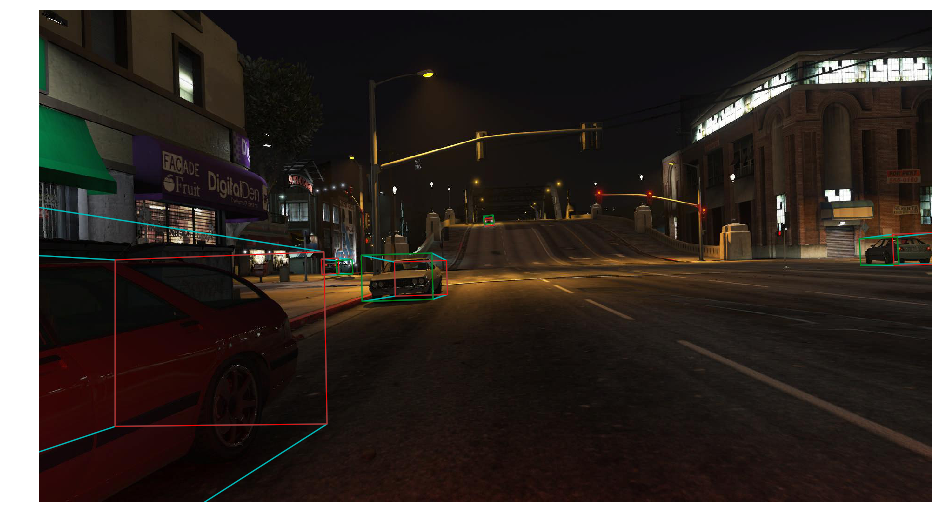

In [6]:
base_name = '2018-03-30--02-02-25--188'
draw3dbboxes(in_directory, out_directory, base_name)

In [7]:
pattern = '[0-9][0-9][0-9][0-9]-[0-9][0-9]-[0-9][0-9]--[0-9][0-9]-[0-9][0-9]-[0-9][0-9]--[0-9][0-9][0-9].jpg'
files = glob.glob(os.path.join(in_directory, pattern))
print('there are {} files'.format(len(files)))


there are 10 files


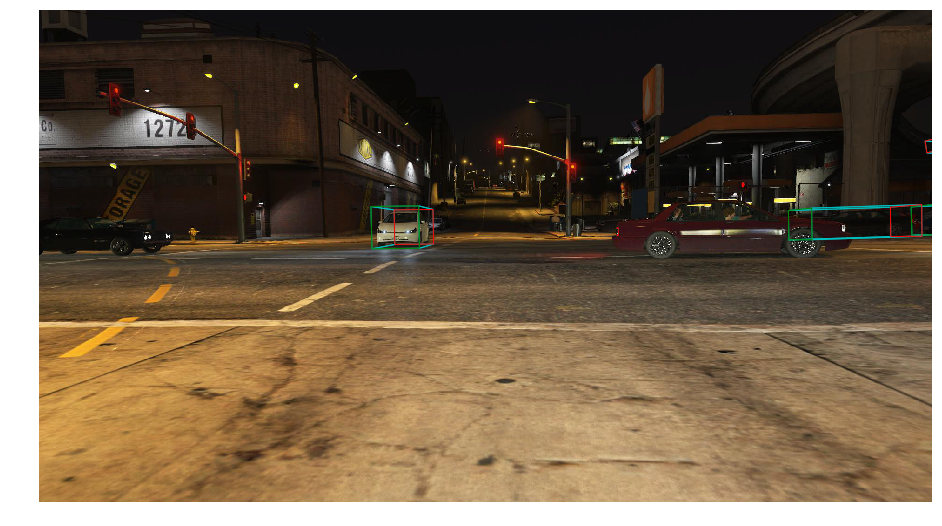

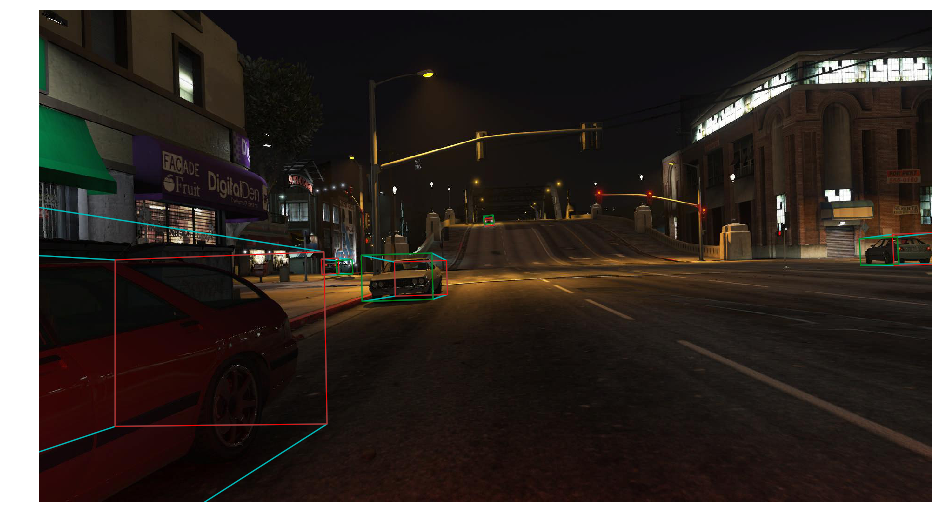

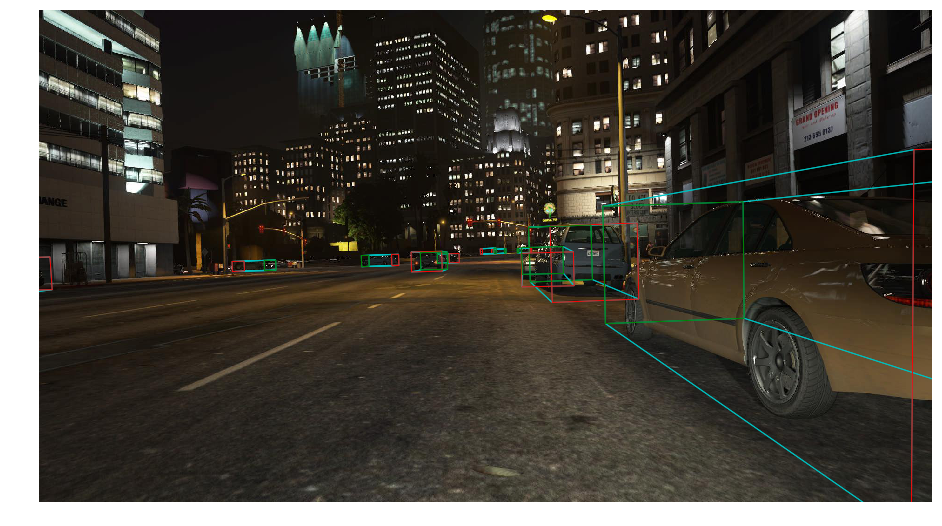

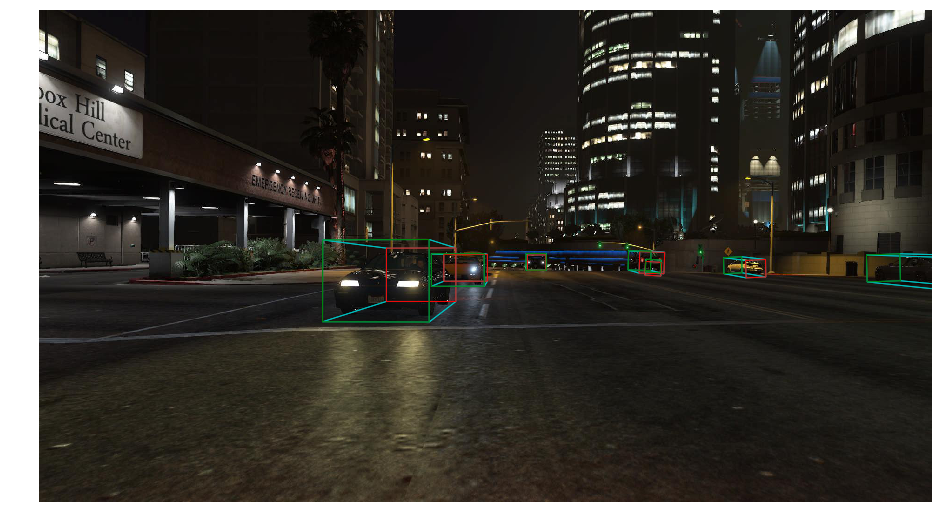

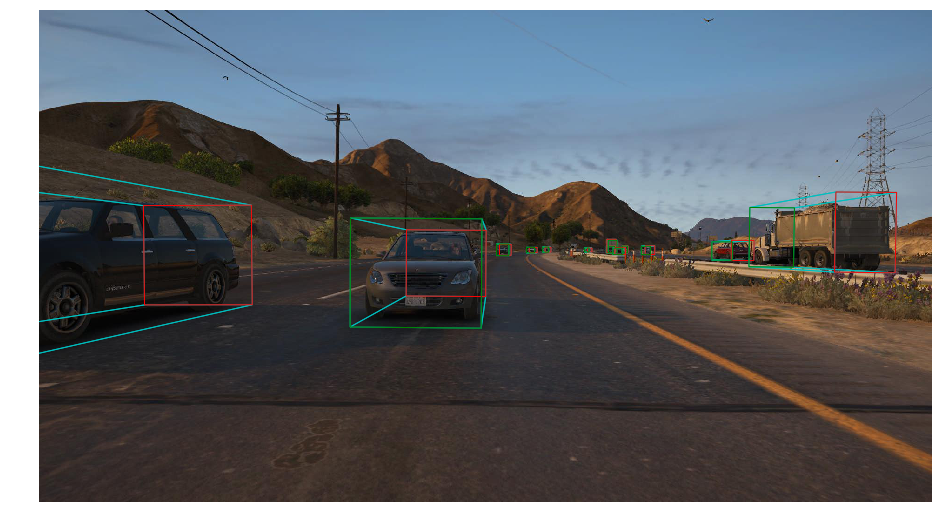

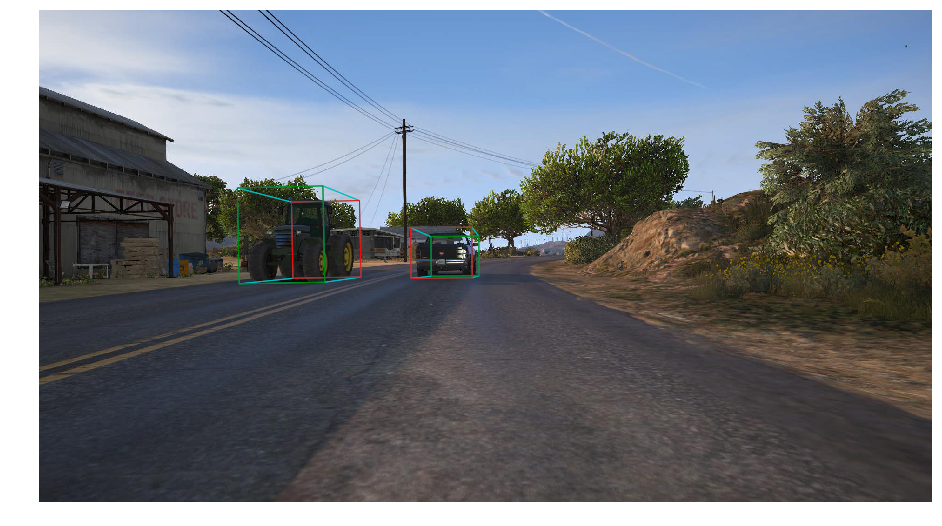

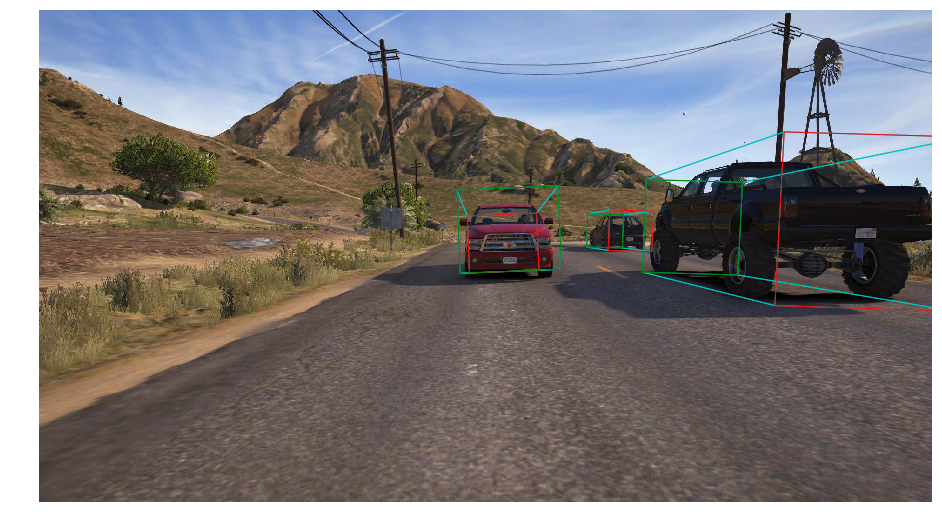

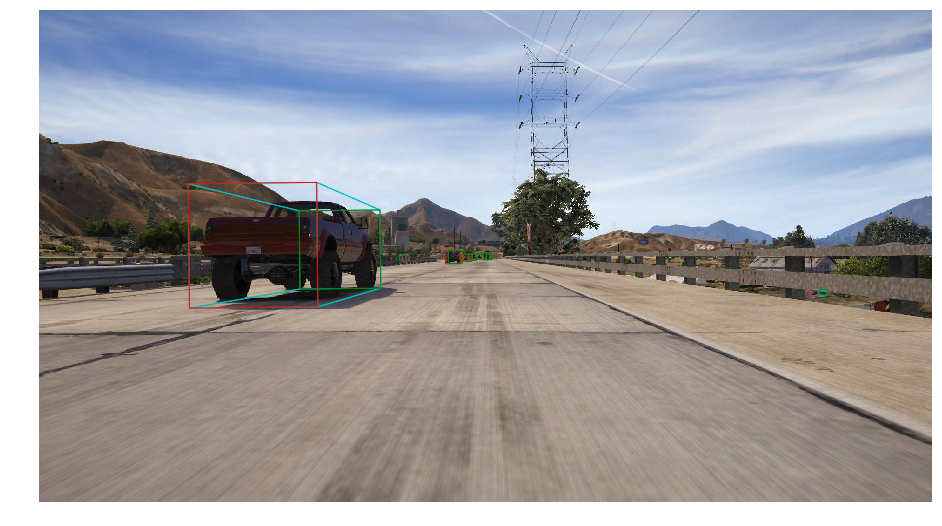

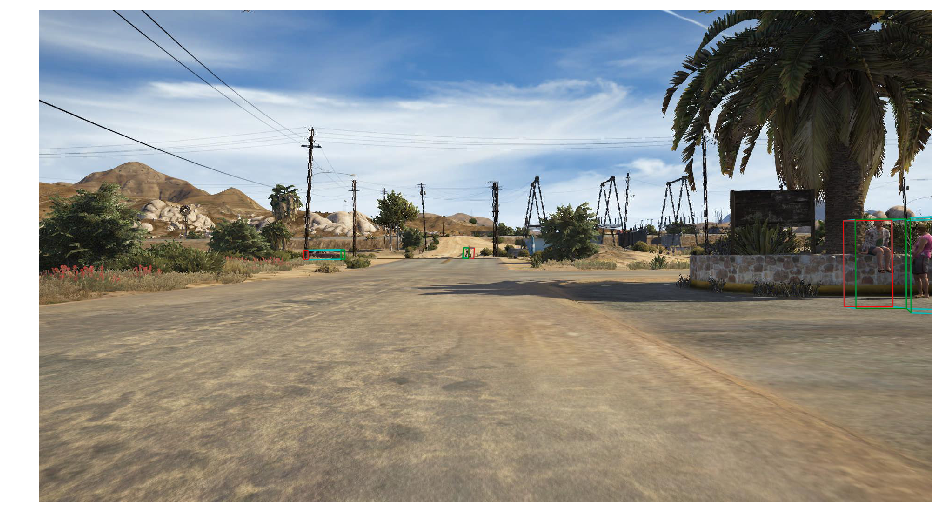

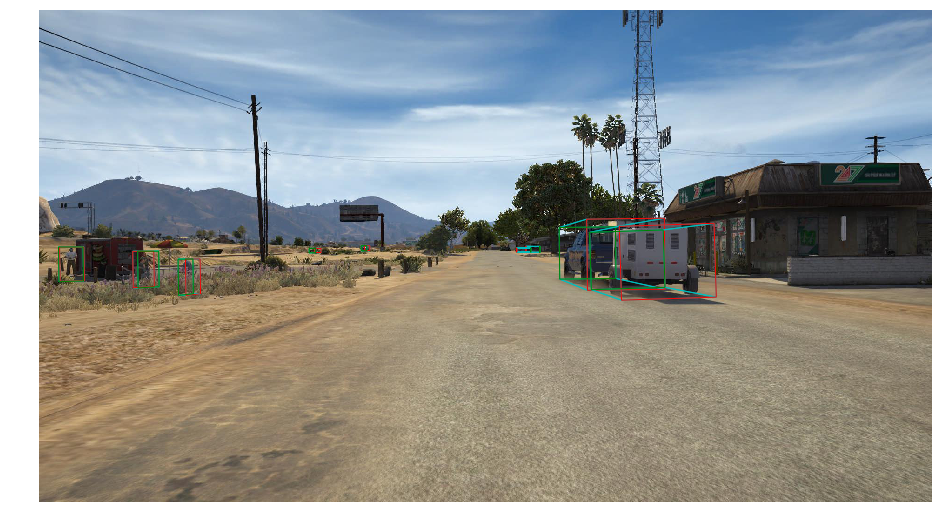

In [8]:
for name in files:
    draw3dbboxes(in_directory, out_directory, get_base_name(name))

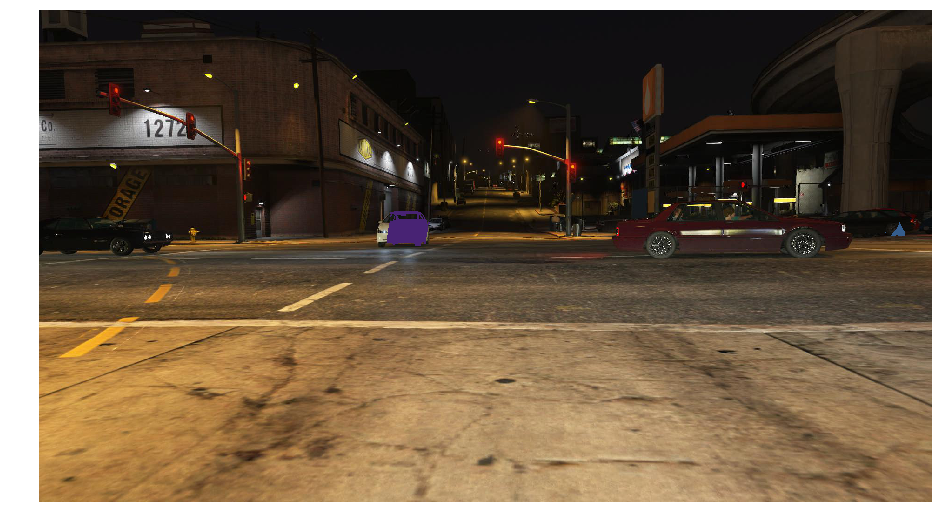

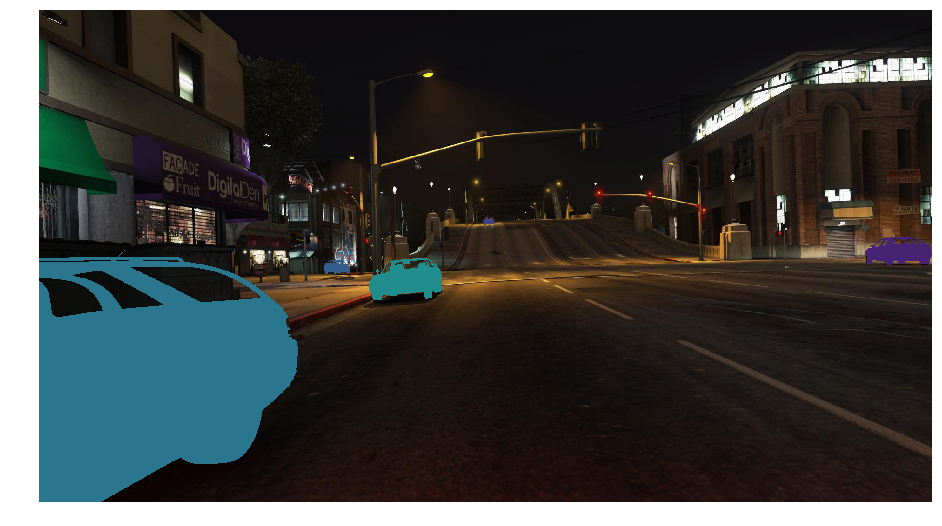

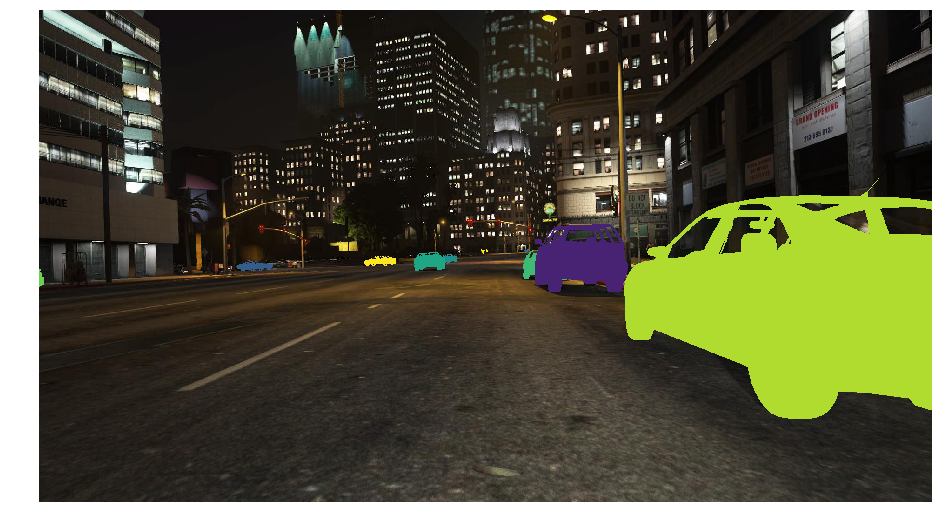

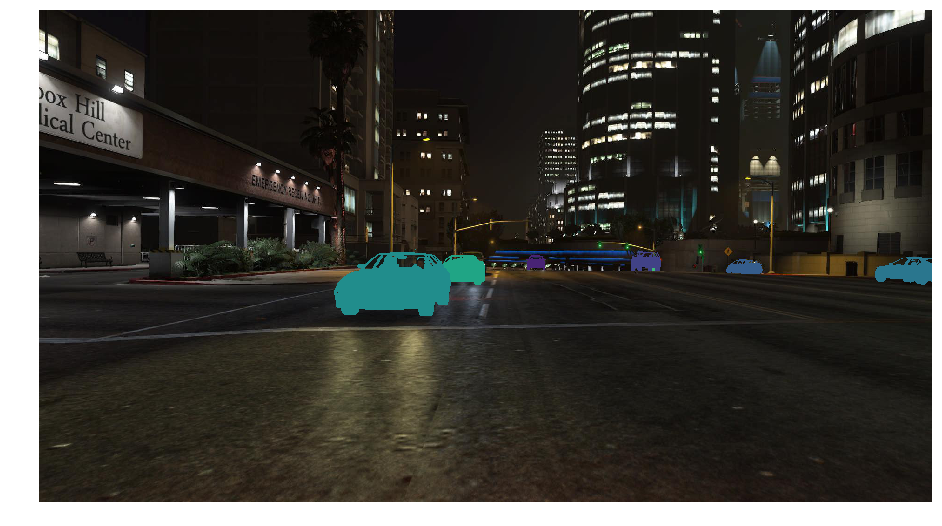

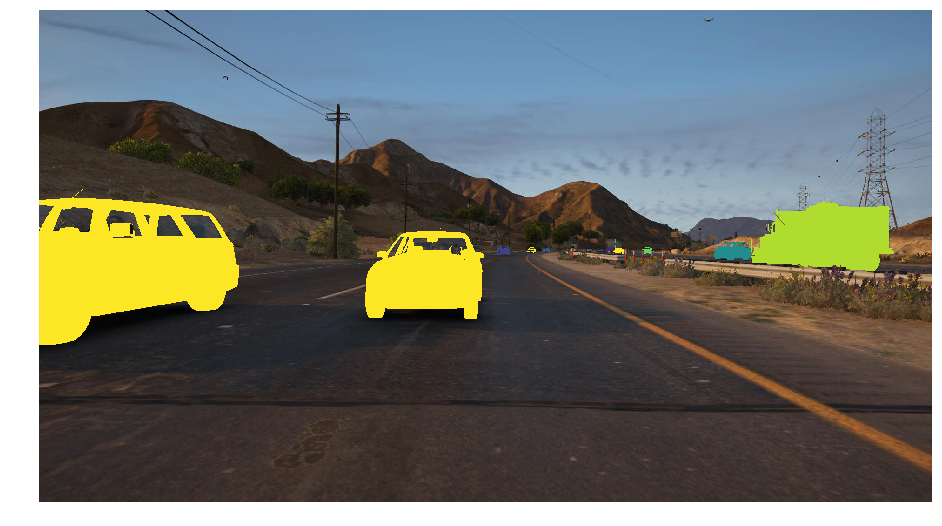

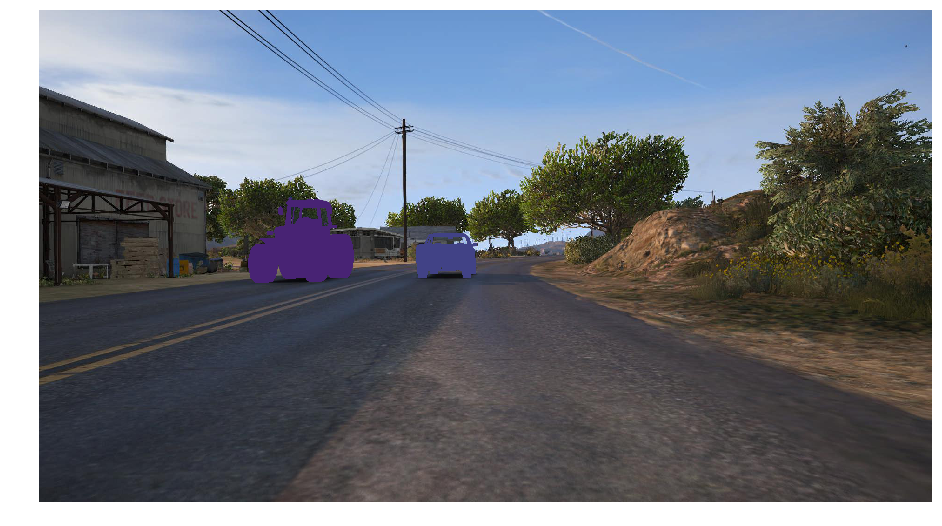

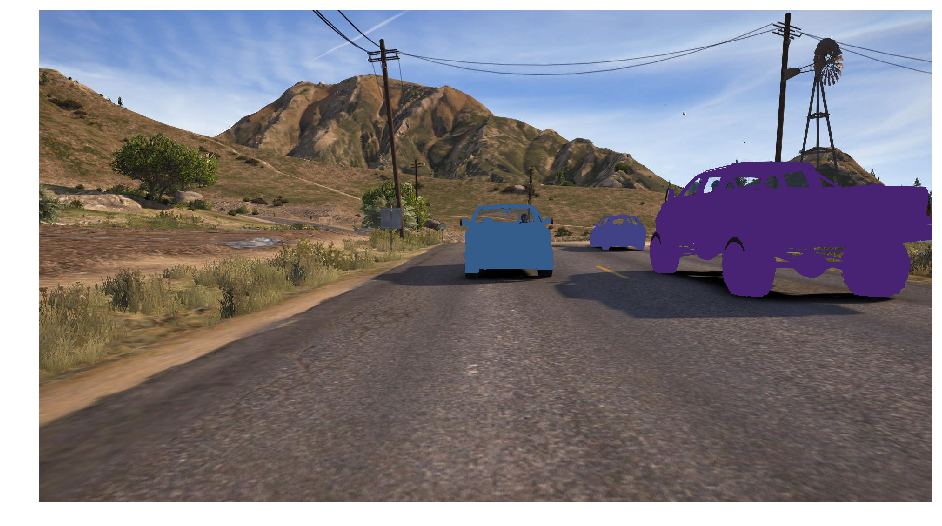

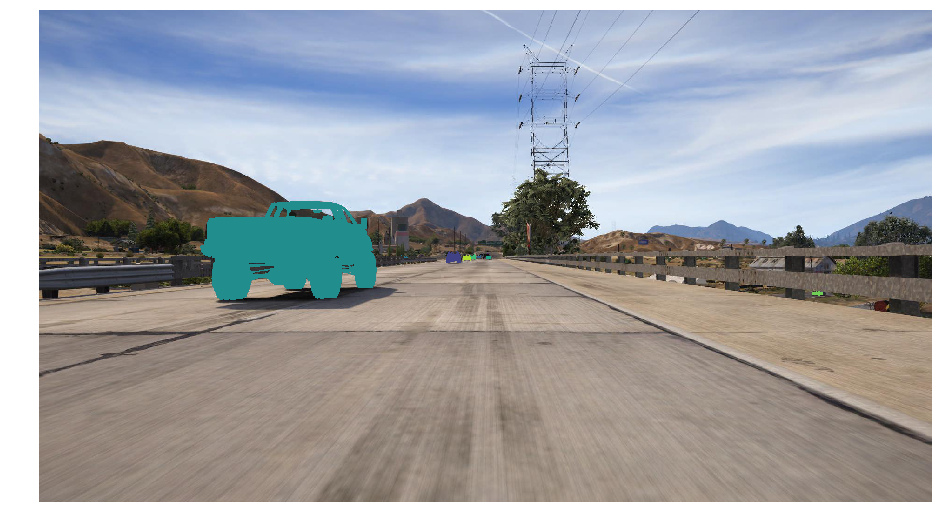

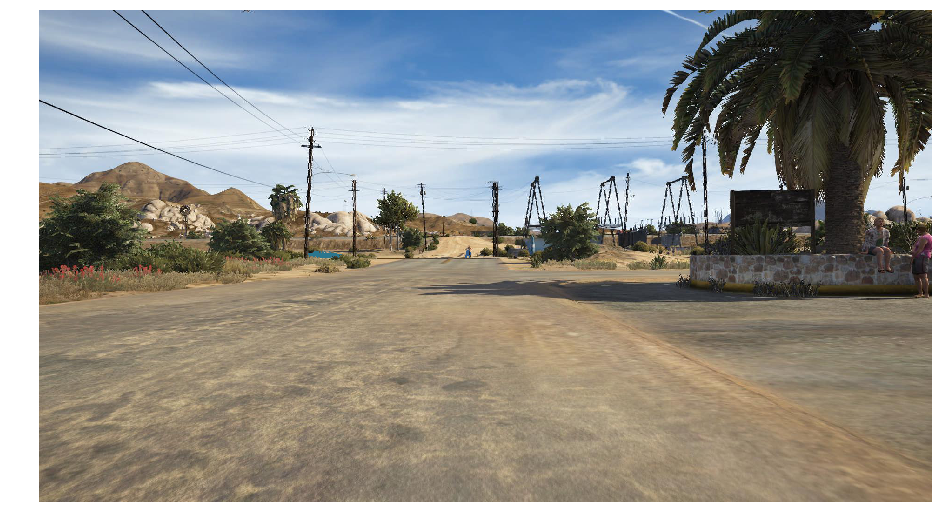

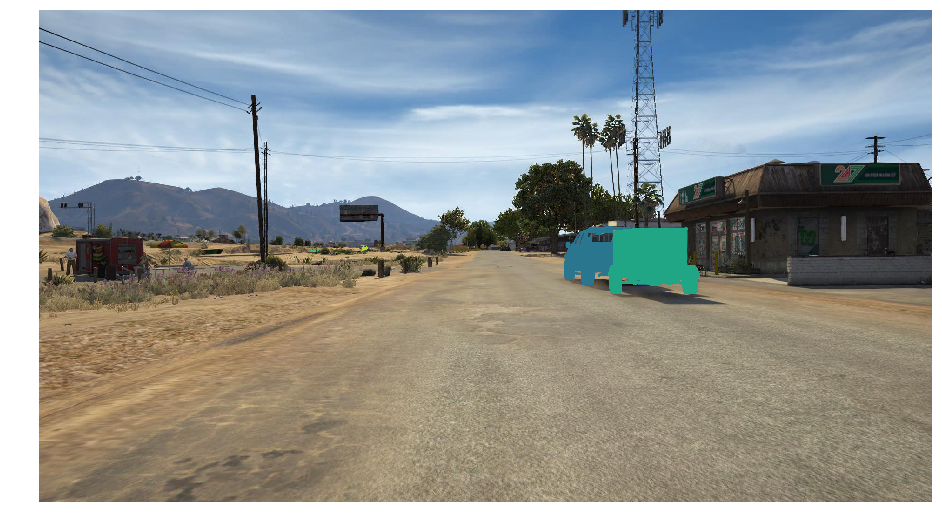

In [9]:
for name in files:
    draw_car_pixels(in_directory, out_directory, get_base_name(name))

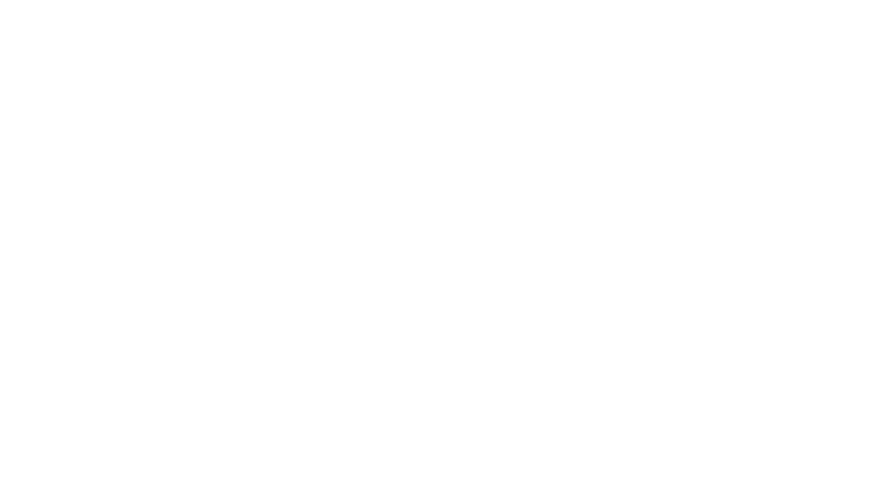

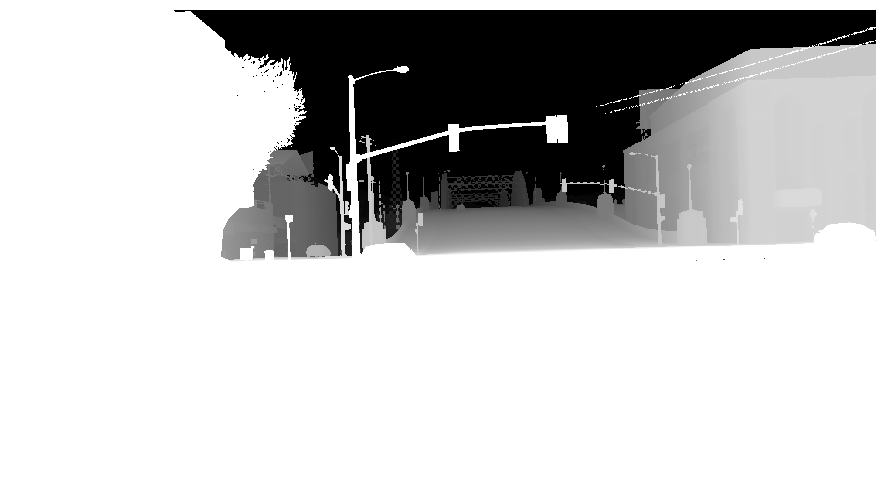

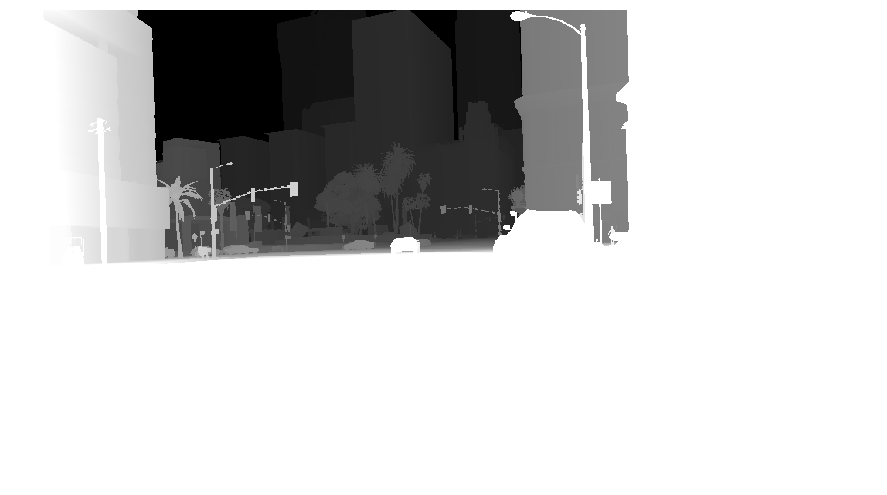

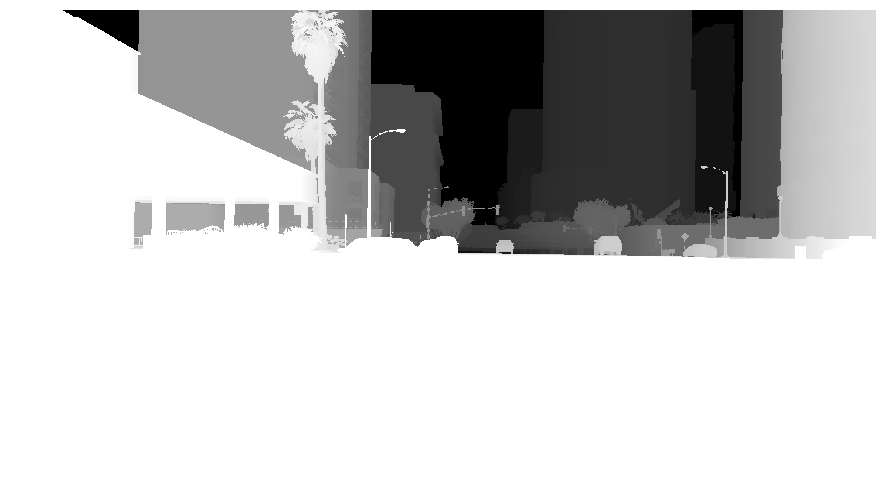

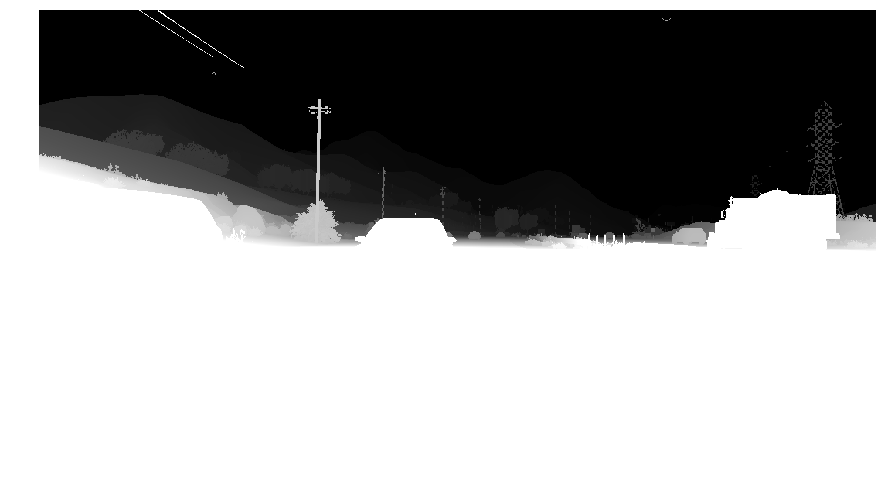

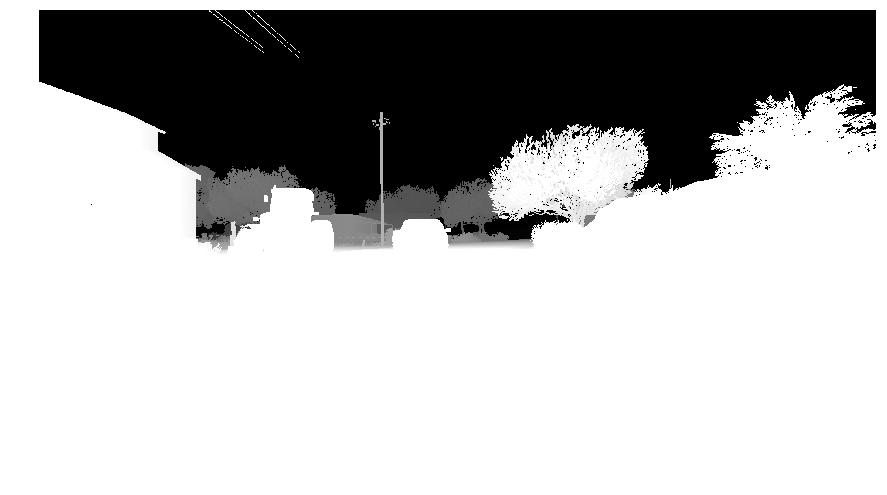

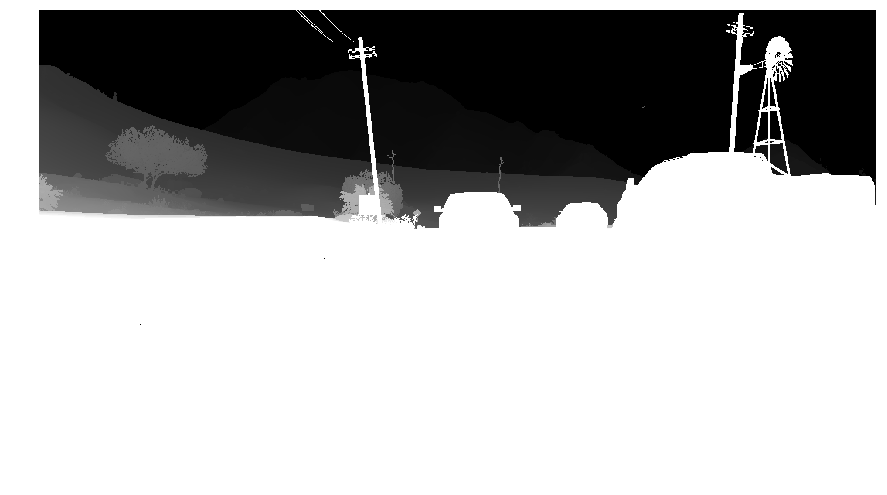

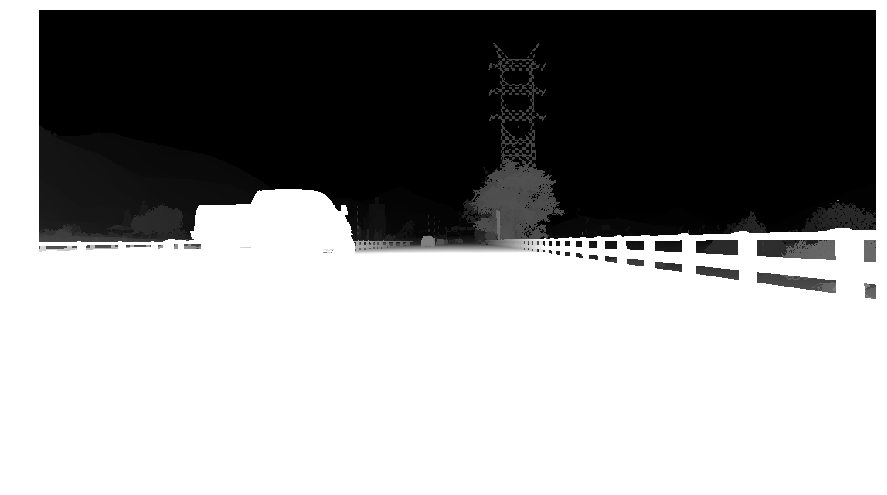

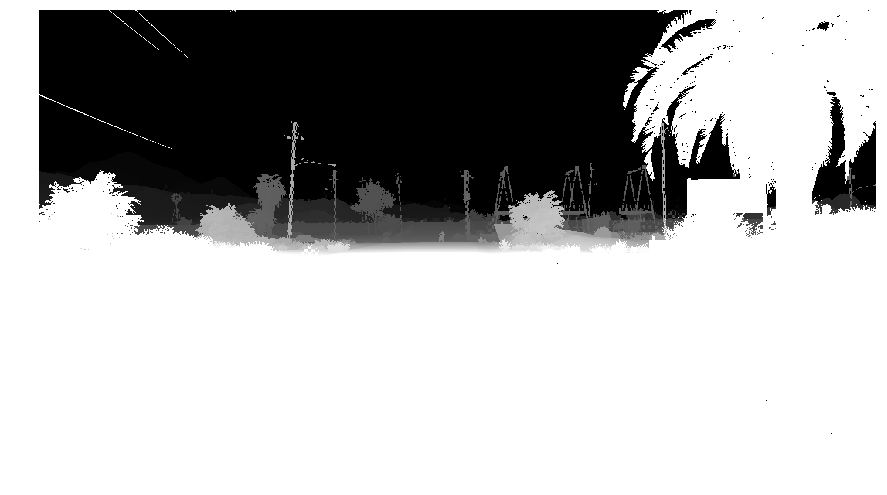

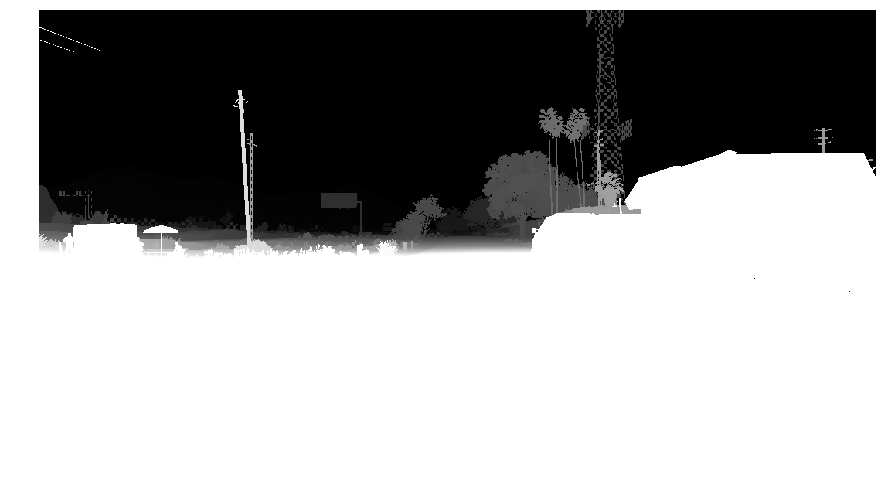

In [18]:
for name in files:
    depth = Image.open(os.path.join(in_directory, get_base_name(name)+'-depth.png'))
    
    plt.figure(figsize=(15, 15))
    plt.axis('off')
    plt.imshow(depth, cmap='gray')
    plt.show()